In [6]:
# === PHẦN 1: CÀI ĐẶT (Ổn định hơn) ===
!apt-get update && apt-get install -y xvfb swig

# Pin (ghim) phiên bản để tránh xung đột
!pip install "pygame==2.1.3"
!pip install git+https://github.com/openai/gym.git@v0.21.0#egg=gym

# Cài các thư viện PyGame và Gym cho game Flappy Bird từ Github
!pip install git+https://github.com/GrupoTuring/PyGame-Learning-Environment
!pip install git+https://github.com/lusob/gym-ple

# Cài các thư viện ML và hiển thị
!pip install "pytorch-lightning>=1.6.0" pyvirtualdisplay

# === PHẦN 2: CODE CHÍNH (VỚI WRAPPER ĐÃ SỬA) ===

Hit:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:3 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:4 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:6 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Hit:7 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Reading package lists... Done
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading package lists... Done
Building dependency tree... Done
Reading

In [25]:
from pyvirtualdisplay import Display
Display(visible=False, size=(1400, 900)).start()

import os
from pytorch_lightning import LightningModule, Trainer
from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import Callback, ModelCheckpoint
import warnings
warnings.filterwarnings("ignore")
import copy
import torch
import random
import gym
import gym_ple
from ple import PLE
from gym import spaces
import matplotlib

import numpy as np
import torch.nn.functional as F

import matplotlib.pyplot as plt
import matplotlib.animation as animation

from collections import deque, namedtuple
from IPython.display import HTML
from base64 import b64encode

from torch import nn
from torch.utils.data import DataLoader
from torch.utils.data.dataset import IterableDataset
from torch.optim import AdamW

from pytorch_lightning import LightningModule, Trainer

from gym.wrappers import TransformObservation

device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
num_gpus = torch.cuda.device_count()

# Copied from: https://colab.research.google.com/github/deepmind/dm_control/blob/master/tutorial.ipynb#scrollTo=gKc1FNhKiVJX

def display_video(frames, framerate=30):
  height, width, _ = frames[0].shape
  dpi = 70
  orig_backend = matplotlib.get_backend()
  matplotlib.use('Agg')
  fig, ax = plt.subplots(1, 1, figsize=(width / dpi, height / dpi), dpi=dpi)
  matplotlib.use(orig_backend)
  ax.set_axis_off()
  ax.set_aspect('equal')
  ax.set_position([0, 0, 1, 1])
  im = ax.imshow(frames[0])
  def update(frame):
    im.set_data(frame)
    return [im]
  interval = 1000/framerate
  anim = animation.FuncAnimation(fig=fig, func=update, frames=frames,
                                  interval=interval, blit=True, repeat=False)
  return HTML(anim.to_html5_video())

class DQN(nn.Module):

  def __init__(self, hidden_size, obs_size, n_actions):
    super().__init__()
    self.net = nn.Sequential(
        nn.Linear(obs_size, hidden_size),
        nn.ReLU(),
        nn.Linear(hidden_size, hidden_size),
        nn.ReLU()
    )

    self.fc_adv = nn.Linear(hidden_size, n_actions)
    self.fc_value = nn.Linear(hidden_size, 1)

class VideoLogger(Callback):
    """
    Mỗi N epoch, chạy policy trên env để ghi frames thành video mp4
    và save vào videos/epoch_{epoch}.mp4
    """
    def __init__(self, env, policy, q_net, every_n_epochs=100, max_episodes=1):
        super().__init__()
        self.env = env
        self.policy = policy
        self.q_net = q_net
        self.every_n = every_n_epochs
        self.max_eps = max_episodes
        os.makedirs("videos", exist_ok=True)

    def on_train_epoch_end(self, trainer, pl_module):
        epoch = trainer.current_epoch
        if (epoch + 1) % self.every_n == 0:
            from matplotlib.animation import FFMpegWriter
            import matplotlib.pyplot as plt

            all_frames = []
            for ep in range(self.max_eps):
                done = False
                obs = self.env.reset()
                while not done:
                    frame = self.env.render(mode='rgb_array')
                    all_frames.append(frame)
                    action = self.policy(obs, self.env, self.q_net)
                    obs, _, done, _ = self.env.step(action)

            # save video as mp4
            height, width, _ = all_frames[0].shape
            fig = plt.figure(figsize=(width/100, height/100), dpi=100)
            im = plt.imshow(all_frames[0])
            plt.axis('off')
            writer = FFMpegWriter(fps=30)
            path = f"videos/epoch_{epoch+1}.mp4"
            with writer.saving(fig, path, dpi=100):
                for frame in all_frames:
                    im.set_data(frame)
                    writer.grab_frame()
            plt.close(fig)
            pl_module.logger.experiment.add_video(
                "rollout_video",
                torch.tensor(all_frames).permute(0,3,1,2).unsqueeze(0)/255.0,
                global_step=epoch,
                fps=30
            )

def forward(self, x):
    x = self.net(x.float())
    adv = self.fc_adv(x)
    value = self.fc_value(x)
    return value + adv - torch.mean(adv, dim=1, keepdim=True)

def epsilon_greedy(state, env, net, epsilon=0.0):
  if np.random.random() < epsilon:
    action = env.action_space.sample()
  else:
    state = torch.tensor([state]).to(device)
    q_values = net(state)
    _, action = torch.max(q_values, dim=1)
    action = int(action.item())
  return action

class ReplayBuffer:

  def __init__(self, capacity):
    self.buffer = deque(maxlen=capacity)

  def __len__(self):
    return len(self.buffer)

  def append(self, experience):
    self.buffer.append(experience)

  def sample(self, batch_size):
    return random.sample(self.buffer, batch_size)

class RLDataset(IterableDataset):

  def __init__(self, buffer, sample_size=400):
    self.buffer = buffer
    self.sample_size = sample_size

  def __iter__(self):
    for experience in self.buffer.sample(self.sample_size):
      yield experience

class RunningMeanStd:
    # https://en.wikipedia.org/wiki/Algorithms_for_calculating_variance#Parallel_algorithm
    def __init__(self, epsilon=1e-4, shape=()):
        self.mean = np.zeros(shape, "float64")
        self.var = np.ones(shape, "float64")
        self.count = epsilon

    def update(self, x):
        batch_mean = np.mean(x, axis=0)
        batch_var = np.var(x, axis=0)
        batch_count = x.shape[0]
        self.update_from_moments(batch_mean, batch_var, batch_count)

    def update_from_moments(self, batch_mean, batch_var, batch_count):
        self.mean, self.var, self.count = update_mean_var_count_from_moments(
            self.mean, self.var, self.count, batch_mean, batch_var, batch_count
        )


def update_mean_var_count_from_moments(
    mean, var, count, batch_mean, batch_var, batch_count
):
    delta = batch_mean - mean
    tot_count = count + batch_count

    new_mean = mean + delta * batch_count / tot_count
    m_a = var * count
    m_b = batch_var * batch_count
    M2 = m_a + m_b + np.square(delta) * count * batch_count / tot_count
    new_var = M2 / tot_count
    new_count = tot_count

    return new_mean, new_var, new_count


class NormalizeObservation(gym.core.Wrapper):
    def __init__(
        self,
        env,
        epsilon=1e-8,
    ):
        super().__init__(env)
        self.num_envs = getattr(env, "num_envs", 1)
        self.is_vector_env = getattr(env, "is_vector_env", False)
        if self.is_vector_env:
            self.obs_rms = RunningMeanStd(shape=self.single_observation_space.shape)
        else:
            self.obs_rms = RunningMeanStd(shape=self.observation_space.shape)
        self.epsilon = epsilon

    def step(self, action):
        obs, rews, dones, infos = self.env.step(action)
        if self.is_vector_env:
            obs = self.normalize(obs)
        else:
            obs = self.normalize(np.array([obs]))[0]
        return obs, rews, dones, infos

    def reset(self, **kwargs):
        return_info = kwargs.get("return_info", False)
        if return_info:
            obs, info = self.env.reset(**kwargs)
        else:
            obs = self.env.reset(**kwargs)
        if self.is_vector_env:
            obs = self.normalize(obs)
        else:
            obs = self.normalize(np.array([obs]))[0]
        if not return_info:
            return obs
        else:
            return obs, info

    def normalize(self, obs):
        self.obs_rms.update(obs)
        return (obs - self.obs_rms.mean) / np.sqrt(self.obs_rms.var + self.epsilon)


class NormalizeReward(gym.core.Wrapper):
    def __init__(
        self,
        env,
        gamma=0.99,
        epsilon=1e-8,
    ):
        super().__init__(env)
        self.num_envs = getattr(env, "num_envs", 1)
        self.is_vector_env = getattr(env, "is_vector_env", False)
        self.return_rms = RunningMeanStd(shape=())
        self.returns = np.zeros(self.num_envs)
        self.gamma = gamma
        self.epsilon = epsilon

    def step(self, action):
        obs, rews, dones, infos = self.env.step(action)
        if not self.is_vector_env:
            rews = np.array([rews])
        self.returns = self.returns * self.gamma + rews
        rews = self.normalize(rews)
        self.returns[dones] = 0.0
        if not self.is_vector_env:
            rews = rews[0]
        return obs, rews, dones, infos

    def normalize(self, rews):
        self.return_rms.update(self.returns)
        return rews / np.sqrt(self.return_rms.var + self.epsilon)


env = gym_ple.make("FlappyBird-v0")

env.reset()
env.unwrapped.game_state.getGameState()

list(env.unwrapped.game_state.getGameState().values())

env.unwrapped.game_state.frame_skip = 4

class StateVectorWrapper(gym.Wrapper):
    def __init__(self, env):
        super().__init__(env)
        state = self._get_state_vector()
        self.observation_space = gym.spaces.Box(
            low=-np.inf, high=np.inf,
            shape=state.shape, dtype=np.float32
        )

    def _get_state_vector(self):
        gs = self.env.unwrapped.game_state.getGameState()
        return np.array(list(gs.values()), dtype=np.float32)

    def reset(self, **kwargs):
        # unwrap đến đúng PLEEnv:
        ple_env = self.env.unwrapped
        # gọi _reset() của PLEEnv để reset game và lấy image (mình bỏ qua image)
        _ = ple_env._reset(**kwargs)
        # trả về vector state của bạn
        return self._get_state_vector()

    def step(self, action):
        ple_env = self.env.unwrapped
        # gọi _step() thay vì step()
        _, reward, done, info = ple_env._step(action)
        # trả về vector state + reward, done, info
        return self._get_state_vector(), reward, done, info

    def render(self, mode='rgb_array'):
        ple_env = self.env.unwrapped
        return ple_env._render(mode)



def create_environment(name):
  env = gym_ple.make(name)
  env = StateVectorWrapper(env)
  env = NormalizeObservation(env)
  env = NormalizeReward(env)
  return env


env = create_environment('FlappyBird-v0')
frames = []
for _ in range(5):
    done = False
    _ = env.reset()
    while not done:
        frames.append(env.render(mode='rgb_array'))
        _, _, done, _ = env.step(env.action_space.sample())
display_video(frames)

class DeepQLearning(LightningModule):

  # Initialize.
    def __init__(self, env_name, policy=epsilon_greedy, capacity=100_000,
                 batch_size=256, lr=1e-3, hidden_size=128, gamma=0.99,
                 loss_fn=F.smooth_l1_loss, optim=AdamW, eps_start=1.0, eps_end=0.15,
                 eps_last_episode=100, samples_per_epoch=1_000, sync_rate=10):


    super().__init__()
    self.env = create_environment(env_name)
    self.logger: TensorBoardLogger  # type hint để PyL recognize

    obs_size = self.env.observation_space.shape[0]
    n_actions = self.env.action_space.n

    self.q_net = DQN(hidden_size, obs_size, n_actions)

    self.target_q_net = copy.deepcopy(self.q_net)

    self.policy = policy
    self.buffer = ReplayBuffer(capacity=capacity)

    self.save_hyperparameters()

    while len(self.buffer) < self.hparams.samples_per_epoch:
      print(f"{len(self.buffer)} samples in experience buffer. Filling...")
      self.play_episode(epsilon=self.hparams.eps_start)

  @torch.no_grad()
  def play_episode(self, policy=None, epsilon=0.):
    state = self.env.reset()
    done = False

    while not done:
      if policy:
        action = policy(state, self.env, self.q_net, epsilon=epsilon)
      else:
        action = self.env.action_space.sample()
      next_state, reward, done, info = self.env.step(action)
      exp = (state, action, reward, done, next_state)
      self.buffer.append(exp)
      state = next_state

  # Forward.
  def forward(self, x):
    return self.q_net(x)

  # Configure optimizers.
  def configure_optimizers(self):
    q_net_optimizer = self.hparams.optim(self.q_net.parameters(), lr=self.hparams.lr)
    return [q_net_optimizer]

  # Create dataloader.
  def train_dataloader(self):
    dataset = RLDataset(self.buffer, self.hparams.samples_per_epoch)
    dataloader = DataLoader(
        dataset=dataset,
        batch_size=self.hparams.batch_size
    )
    return dataloader

  # Training step.
  def training_step(self, batch, batch_idx):
    states, actions, rewards, dones, next_states = batch
    loss = self.hparams.loss_fn(state_action_values, expected_state_action_values)
    actions = actions.unsqueeze(1)
    rewards = rewards.unsqueeze(1)
    dones = dones.unsqueeze(1)

    state_action_values = self.q_net(states).gather(1, actions)

    with torch.no_grad():
      _, next_actions = self.q_net(next_states).max(dim=1, keepdim=True)
      next_action_values = self.target_q_net(next_states).gather(1, next_actions)
      next_action_values[dones] = 0.0

    expected_state_action_values = rewards + self.hparams.gamma * next_action_values

    loss = self.hparams.loss_fn(state_action_values, expected_state_action_values)
    self.log('loss/Q_error', loss, on_step=True, on_epoch=False)
    self.log('reward/step_mean', rewards.mean(), on_step=True, on_epoch=False)
    self.log('episode/Q-Error', loss)
    return loss

    def on_train_epoch_end(self):
        epsilon = max(
            self.hparams.eps_end,
            self.hparams.eps_start - self.current_epoch / self.hparams.eps_last_episode
        )

        self.log('hyper/epsilon', epsilon, on_step=False, on_epoch=True)

        # Thu thêm dữ liệu cho buffer
        self.play_episode(policy=self.policy, epsilon=epsilon)

        # Log reward
        self.log('episode/Return', self.env.unwrapped.game_state.score())

        score = self.env.unwrapped.game_state.score()
        self.log('episode/score', score, on_step=False, on_epoch=True)

        # Cập nhật target network
        if self.current_epoch % self.hparams.sync_rate == 0:
            self.target_q_net.load_state_dict(self.q_net.state_dict())

        print(f"Epoch {self.current_epoch}: buffer size = {len(self.buffer)}")


logger = TensorBoardLogger("lightning_logs", name="flappy_dqn")
checkpoint = ModelCheckpoint(
    dirpath="checkpoints/",
    every_n_epochs=50,
    save_top_k=-1,
    filename="epoch{epoch}"
)

video_cb = VideoLogger(env=create_environment('FlappyBird-v0'),
                       policy=epsilon_greedy,
                       q_net=lambda x: None,  # sẽ override ngay sau trainer.fit bắt đầu
                       every_n_epochs=50,
                       max_episodes=1)

trainer = Trainer(
    logger=logger,
    callbacks=[checkpoint, video_cb],
    devices=num_gpus,
    accelerator="gpu",
    max_epochs=3000,
    log_every_n_steps=1
)

def _on_fit_start(_):
    video_cb.q_net = algo.q_net
trainer.callbacks[1].on_fit_start = _on_fit_start
trainer.fit(algo)


env = algo.env
policy = algo.policy
q_net = algo.q_net
frames = []

for episode in range(10):
  done = False
  obs = env.reset()
  while not done:
    frames.append(env.render(mode='rgb_array'))
    action = policy(obs, env, q_net)
    obs, _, done, _ = env.step(action)



algo = DeepQLearning('FlappyBird-v0', lr=5e-4, hidden_size=512,
                     eps_end=0.01, eps_last_episode=1000, capacity=10_000, gamma=0.9)

trainer.fit(algo)

display_video(frames)



























IndentationError: unindent does not match any outer indentation level (<tokenize>, line 364)

Filling initial replay buffer...


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name         | Type | Params | Mode 
----------------------------------------------
0 | q_net        | DQN  | 268 K  | train
1 | target_q_net | DQN  | 268 K  | train
----------------------------------------------
537 K     Trainable params
0         Non-trainable params
537 K     Total params
2.150     Total estimated model params size (MB)
16        Modules in train mode
0         Modules in eval mode


Buffer filled.
Bắt đầu huấn luyện...


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=3000` reached.


Huấn luyện hoàn tất.
Đang tạo video demo với agent đã huấn luyện...


RuntimeError: Expected all tensors to be on the same device, but found at least two devices, cpu and cuda:0! (when checking argument for argument mat1 in method wrapper_CUDA_addmm)

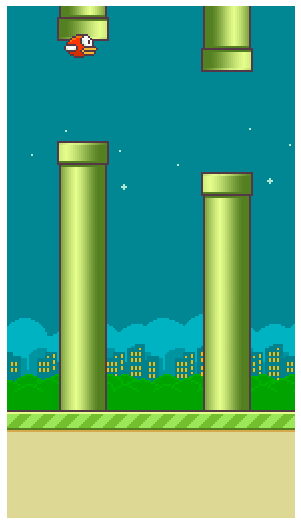

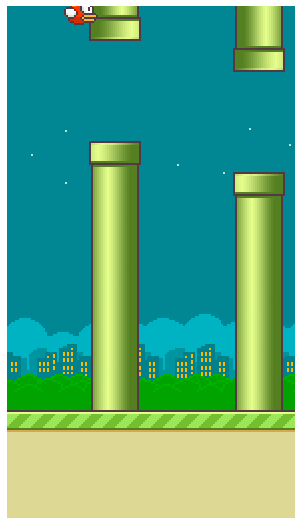

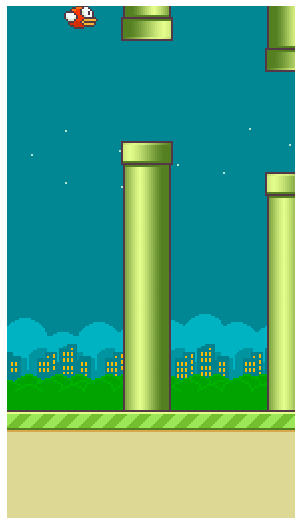

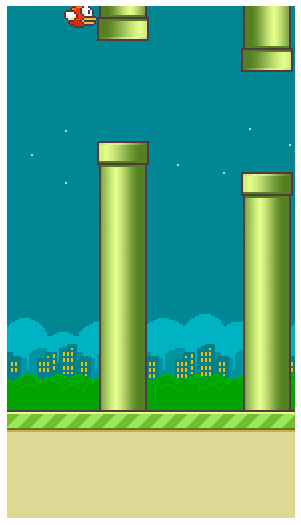

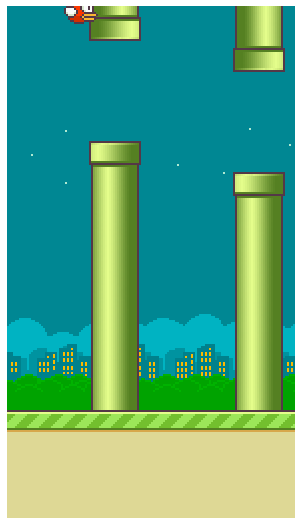

In [26]:
# --- Phần import và các hàm/lớp tiện ích (không thay đổi) ---
from pyvirtualdisplay import Display
Display(visible=False, size=(1400, 900)).start()

import os
from pytorch_lightning import LightningModule, Trainer
from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import Callback, ModelCheckpoint
import warnings
warnings.filterwarnings("ignore")
import copy
import torch
import random
import gym
import gym_ple
from ple import PLE
from gym import spaces
import matplotlib

import numpy as np
import torch.nn.functional as F

import matplotlib.pyplot as plt
import matplotlib.animation as animation

from collections import deque, namedtuple
from IPython.display import HTML
from base64 import b64encode

from torch import nn
from torch.utils.data import DataLoader
from torch.utils.data.dataset import IterableDataset
from torch.optim import AdamW

from pytorch_lightning import LightningModule, Trainer

from gym.wrappers import TransformObservation

device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
num_gpus = torch.cuda.device_count()

def display_video(frames, framerate=30):
  if not frames:
      print("Không có frame nào để hiển thị video.")
      return
  height, width, _ = frames[0].shape
  dpi = 70
  orig_backend = matplotlib.get_backend()
  matplotlib.use('Agg')
  fig, ax = plt.subplots(1, 1, figsize=(width / dpi, height / dpi), dpi=dpi)
  matplotlib.use(orig_backend)
  ax.set_axis_off()
  ax.set_aspect('equal')
  ax.set_position([0, 0, 1, 1])
  im = ax.imshow(frames[0])
  def update(frame):
    im.set_data(frame)
    return [im]
  interval = 1000/framerate
  anim = animation.FuncAnimation(fig=fig, func=update, frames=frames,
                                  interval=interval, blit=True, repeat=False)
  return HTML(anim.to_html5_video())

class DQN(nn.Module):
    def __init__(self, hidden_size, obs_size, n_actions):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(obs_size, hidden_size),
            nn.ReLU(),
            nn.Linear(hidden_size, hidden_size),
            nn.ReLU()
        )
        self.fc_adv = nn.Linear(hidden_size, n_actions)
        self.fc_value = nn.Linear(hidden_size, 1)

    # LỖI 1: Phương thức forward phải được thụt vào trong class DQN
    def forward(self, x):
        x = self.net(x.float())
        adv = self.fc_adv(x)
        value = self.fc_value(x)
        return value + adv - torch.mean(adv, dim=1, keepdim=True)

class VideoLogger(Callback):
    def __init__(self, env, policy, every_n_epochs=100, max_episodes=1):
        super().__init__()
        self.env = env
        self.policy = policy
        # q_net sẽ được gán sau khi module được khởi tạo
        self.q_net = None
        self.every_n = every_n_epochs
        self.max_eps = max_episodes
        os.makedirs("videos", exist_ok=True)

    def on_train_epoch_end(self, trainer, pl_module):
        # Đảm bảo q_net đã được gán
        if self.q_net is None:
            self.q_net = pl_module.q_net

        epoch = trainer.current_epoch
        if (epoch + 1) % self.every_n == 0:
            from matplotlib.animation import FFMpegWriter
            import matplotlib.pyplot as plt

            all_frames = []
            for ep in range(self.max_eps):
                done = False
                obs = self.env.reset()
                while not done:
                    frame = self.env.render(mode='rgb_array')
                    all_frames.append(frame)
                    action = self.policy(obs, self.env, self.q_net)
                    obs, _, done, _ = self.env.step(action)

            # save video as mp4
            height, width, _ = all_frames[0].shape
            fig = plt.figure(figsize=(width/100, height/100), dpi=100)
            im = plt.imshow(all_frames[0])
            plt.axis('off')
            writer = FFMpegWriter(fps=30)
            path = f"videos/epoch_{epoch+1}.mp4"
            with writer.saving(fig, path, dpi=100):
                for frame in all_frames:
                    im.set_data(frame)
                    writer.grab_frame()
            plt.close(fig)
            if pl_module.logger.experiment:
                pl_module.logger.experiment.add_video(
                    "rollout_video",
                    torch.tensor(all_frames).permute(0,3,1,2).unsqueeze(0)/255.0,
                    global_step=epoch,
                    fps=30
                )

def epsilon_greedy(state, env, net, epsilon=0.0):
  if np.random.random() < epsilon:
    action = env.action_space.sample()
  else:
    state = torch.tensor([state]).to(device)
    q_values = net(state)
    _, action = torch.max(q_values, dim=1)
    action = int(action.item())
  return action

class ReplayBuffer:
  def __init__(self, capacity):
    self.buffer = deque(maxlen=capacity)
  def __len__(self):
    return len(self.buffer)
  def append(self, experience):
    self.buffer.append(experience)
  def sample(self, batch_size):
    return random.sample(self.buffer, batch_size)

class RLDataset(IterableDataset):
  def __init__(self, buffer, sample_size=400):
    self.buffer = buffer
    self.sample_size = sample_size
  def __iter__(self):
    for experience in self.buffer.sample(self.sample_size):
      yield experience

class RunningMeanStd:
    def __init__(self, epsilon=1e-4, shape=()):
        self.mean = np.zeros(shape, "float64")
        self.var = np.ones(shape, "float64")
        self.count = epsilon
    def update(self, x):
        batch_mean = np.mean(x, axis=0)
        batch_var = np.var(x, axis=0)
        batch_count = x.shape[0]
        self.update_from_moments(batch_mean, batch_var, batch_count)
    def update_from_moments(self, batch_mean, batch_var, batch_count):
        self.mean, self.var, self.count = update_mean_var_count_from_moments(
            self.mean, self.var, self.count, batch_mean, batch_var, batch_count
        )

def update_mean_var_count_from_moments(mean, var, count, batch_mean, batch_var, batch_count):
    delta = batch_mean - mean
    tot_count = count + batch_count
    new_mean = mean + delta * batch_count / tot_count
    m_a = var * count
    m_b = batch_var * batch_count
    M2 = m_a + m_b + np.square(delta) * count * batch_count / tot_count
    new_var = M2 / tot_count
    new_count = tot_count
    return new_mean, new_var, new_count

class NormalizeObservation(gym.core.Wrapper):
    def __init__(self, env, epsilon=1e-8):
        super().__init__(env)
        self.num_envs = getattr(env, "num_envs", 1)
        self.is_vector_env = getattr(env, "is_vector_env", False)
        if self.is_vector_env:
            self.obs_rms = RunningMeanStd(shape=self.single_observation_space.shape)
        else:
            self.obs_rms = RunningMeanStd(shape=self.observation_space.shape)
        self.epsilon = epsilon
    def step(self, action):
        obs, rews, dones, infos = self.env.step(action)
        if self.is_vector_env:
            obs = self.normalize(obs)
        else:
            obs = self.normalize(np.array([obs]))[0]
        return obs, rews, dones, infos
    def reset(self, **kwargs):
        obs = self.env.reset(**kwargs)
        if self.is_vector_env:
            obs = self.normalize(obs)
        else:
            obs = self.normalize(np.array([obs]))[0]
        return obs
    def normalize(self, obs):
        self.obs_rms.update(obs)
        return (obs - self.obs_rms.mean) / np.sqrt(self.obs_rms.var + self.epsilon)

class NormalizeReward(gym.core.Wrapper):
    def __init__(self, env, gamma=0.99, epsilon=1e-8):
        super().__init__(env)
        self.num_envs = getattr(env, "num_envs", 1)
        self.is_vector_env = getattr(env, "is_vector_env", False)
        self.return_rms = RunningMeanStd(shape=())
        self.returns = np.zeros(self.num_envs)
        self.gamma = gamma
        self.epsilon = epsilon
    def step(self, action):
        obs, rews, dones, infos = self.env.step(action)
        if not self.is_vector_env:
            rews = np.array([rews])
        self.returns = self.returns * self.gamma + rews
        rews = self.normalize(rews)
        self.returns[dones] = 0.0
        if not self.is_vector_env:
            rews = rews[0]
        return obs, rews, dones, infos
    def normalize(self, rews):
        self.return_rms.update(self.returns)
        return rews / np.sqrt(self.return_rms.var + self.epsilon)

class StateVectorWrapper(gym.Wrapper):
    def __init__(self, env):
        super().__init__(env)
        state = self._get_state_vector()
        self.observation_space = gym.spaces.Box(
            low=-np.inf, high=np.inf,
            shape=state.shape, dtype=np.float32
        )
    def _get_state_vector(self):
        gs = self.env.unwrapped.game_state.getGameState()
        return np.array(list(gs.values()), dtype=np.float32)
    def reset(self, **kwargs):
        ple_env = self.env.unwrapped
        _ = ple_env._reset(**kwargs)
        return self._get_state_vector()
    def step(self, action):
        ple_env = self.env.unwrapped
        _, reward, done, info = ple_env._step(action)
        return self._get_state_vector(), reward, done, info
    def render(self, mode='rgb_array'):
        ple_env = self.env.unwrapped
        return ple_env._render(mode)

def create_environment(name):
  env = gym_ple.make(name)
  env = StateVectorWrapper(env)
  # Đặt frame_skip sau wrapper để có thể truy cập unwrapped env
  env.unwrapped.frame_skip = 4
  env = NormalizeObservation(env)
  env = NormalizeReward(env, gamma=0.9) # gamma phải khớp với gamma của agent
  return env

# --- Lớp LightningModule ---
class DeepQLearning(LightningModule):
    def __init__(self, env_name, policy=epsilon_greedy, capacity=100_000,
                 batch_size=256, lr=1e-3, hidden_size=128, gamma=0.99,
                 loss_fn=F.smooth_l1_loss, optim=AdamW, eps_start=1.0, eps_end=0.15,
                 eps_last_episode=100, samples_per_epoch=1_000, sync_rate=10):

        super().__init__()
        self.env = create_environment(env_name)

        obs_size = self.env.observation_space.shape[0]
        n_actions = self.env.action_space.n

        self.q_net = DQN(hidden_size, obs_size, n_actions)
        self.target_q_net = copy.deepcopy(self.q_net)

        self.policy = policy
        self.buffer = ReplayBuffer(capacity=capacity)

        self.save_hyperparameters()

        # Điền vào buffer một lượng dữ liệu ban đầu
        print("Filling initial replay buffer...")
        while len(self.buffer) < self.hparams.samples_per_epoch:
            self.play_episode(epsilon=self.hparams.eps_start)
        print("Buffer filled.")

    @torch.no_grad()
    def play_episode(self, policy=None, epsilon=0.):
        state = self.env.reset()
        done = False
        total_reward = 0.0

        while not done:
            if policy:
                action = policy(state, self.env, self.q_net, epsilon=epsilon)
            else:
                action = self.env.action_space.sample()
            next_state, reward, done, info = self.env.step(action)
            exp = (state, action, reward, done, next_state)
            self.buffer.append(exp)
            state = next_state
            total_reward += reward
        return total_reward

    def forward(self, x):
        return self.q_net(x)

    def configure_optimizers(self):
        q_net_optimizer = self.hparams.optim(self.q_net.parameters(), lr=self.hparams.lr)
        return [q_net_optimizer]

    def train_dataloader(self):
        dataset = RLDataset(self.buffer, self.hparams.samples_per_epoch)
        dataloader = DataLoader(
            dataset=dataset,
            batch_size=self.hparams.batch_size,
            # num_workers=4 # có thể thêm để tăng tốc
        )
        return dataloader

    def training_step(self, batch, batch_idx):
        states, actions, rewards, dones, next_states = batch
        actions = actions.unsqueeze(1)
        rewards = rewards.unsqueeze(1)
        dones   = dones.unsqueeze(1)

        state_action_values = self.q_net(states).gather(1, actions.long())
        with torch.no_grad():
            _, next_actions = self.q_net(next_states).max(dim=1, keepdim=True)
            next_vals = self.target_q_net(next_states).gather(1, next_actions)
            next_vals[dones] = 0.0
        expected_vals = rewards + self.hparams.gamma * next_vals

        loss = self.hparams.loss_fn(state_action_values, expected_vals)  # ← chỉ dòng này
        self.log('loss/Q_error', loss, on_step=True)
        self.log('reward/step_mean', rewards.mean(), on_step=True)
        return loss


    # LỖI 3: on_train_epoch_end phải cùng cấp với training_step, không nằm bên trong nó
    def on_train_epoch_end(self):
        epsilon = max(
            self.hparams.eps_end,
            self.hparams.eps_start - self.current_epoch / self.hparams.eps_last_episode
        )
        self.log('hyper/epsilon', epsilon, on_step=False, on_epoch=True)

        # Thu thập thêm dữ liệu và log reward
        reward = self.play_episode(policy=self.policy, epsilon=epsilon)
        self.log('episode/Return', reward)

        # Cập nhật target network
        if self.current_epoch % self.hparams.sync_rate == 0:
            self.target_q_net.load_state_dict(self.q_net.state_dict())

# --- Khối thực thi chính ---

# LỖI 4: Định nghĩa algo trước khi dùng nó trong trainer.fit()
algo = DeepQLearning('FlappyBird-v0', lr=5e-4, hidden_size=512,
                     eps_end=0.01, eps_last_episode=1500, capacity=50_000, gamma=0.9,
                     batch_size=512, sync_rate=20, samples_per_epoch=2000)

logger = TensorBoardLogger("lightning_logs", name="flappy_dqn")
checkpoint_cb = ModelCheckpoint(
    dirpath="checkpoints/",
    every_n_epochs=100,
    save_top_k=-1,
    filename="epoch{epoch}"
)

# Khởi tạo callback video
video_cb = VideoLogger(env=create_environment('FlappyBird-v0'),
                       policy=epsilon_greedy,
                       every_n_epochs=100, # Ghi video mỗi 100 epoch
                       max_episodes=1)


trainer = Trainer(
    logger=logger,
    callbacks=[checkpoint_cb, video_cb],
    devices=num_gpus,
    accelerator="gpu" if num_gpus > 0 else "cpu",
    max_epochs=3000,
    log_every_n_steps=5
)

# LỖI 4: Gọi fit sau khi đã cấu hình mọi thứ
print("Bắt đầu huấn luyện...")
trainer.fit(algo)
print("Huấn luyện hoàn tất.")


# LỖI 4: Khối tạo video cuối cùng phải được đặt sau khi huấn luyện xong
print("Đang tạo video demo với agent đã huấn luyện...")
frames = []
env = algo.env
q_net = algo.q_net

for episode in range(5): # Tạo video cho 5 episodes
  done = False
  obs = env.reset()
  while not done:
    frames.append(env.render(mode='rgb_array'))
    # Dùng epsilon=0 để agent hành động tham lam (greedy)
    action = epsilon_greedy(obs, env, q_net, epsilon=0.0)
    obs, _, done, _ = env.step(action)

# Hiển thị video
print("Hiển thị video...")
display_video(frames)


# khối thực thi theo gpt o3

In [ ]:
# --- Khối thực thi chính ---

# LỖI 4: Định nghĩa algo trước khi dùng nó trong trainer.fit()
algo = DeepQLearning('FlappyBird-v0', lr=5e-4, hidden_size=512,
                     eps_end=0.01, eps_last_episode=1500, capacity=50_000, gamma=0.9,
                     batch_size=512, sync_rate=20, samples_per_epoch=2000)

logger = TensorBoardLogger("lightning_logs", name="flappy_dqn")
checkpoint_cb = ModelCheckpoint(
    dirpath="checkpoints/",
    every_n_epochs=100,
    save_top_k=-1,
    filename="epoch{epoch}"
)

# Khởi tạo callback video
video_cb = VideoLogger(env=create_environment('FlappyBird-v0'),
                       policy=epsilon_greedy,
                       every_n_epochs=100, # Ghi video mỗi 100 epoch
                       max_episodes=1)


trainer = Trainer(
    logger=logger,
    callbacks=[checkpoint_cb, video_cb],
    devices=num_gpus,
    accelerator="gpu" if num_gpus > 0 else "cpu",
    max_epochs=3000,
    log_every_n_steps=5
)

# LỖI 4: Gọi fit sau khi đã cấu hình mọi thứ
print("Bắt đầu huấn luyện...")
trainer.fit(algo)
print("Huấn luyện hoàn tất.")


# LỖI 4: Khối tạo video cuối cùng phải được đặt sau khi huấn luyện xong
print("Đang tạo video demo với agent đã huấn luyện...")
frames = []
env = algo.env
q_net = algo.q_net

for episode in range(5): # Tạo video cho 5 episodes
  done = False
  obs = env.reset()
  while not done:
    frames.append(env.render(mode='rgb_array'))
    # Dùng epsilon=0 để agent hành động tham lam (greedy)
    action = epsilon_greedy(obs, env, q_net, epsilon=0.0)
    obs, _, done, _ = env.step(action)

# Hiển thị video
print("Hiển thị video...")
display_video(frames)


# khối thực thi tiêu chuẩn theo thầy javi

In [ ]:
# LỖI 4: Định nghĩa `algo` trước khi dùng nó trong `trainer.fit()`
algo = DeepQLearning('FlappyBird-v0', lr=5e-4, hidden_size=512,
                     eps_end=0.01, eps_last_episode=1_000, capacity=10_000, gamma=0.9,
                     batch_size=512, sync_rate=10, samples_per_epoch=2000)

logger = TensorBoardLogger("lightning_logs", name="flappy_dqn")
checkpoint_cb = ModelCheckpoint(
    dirpath="checkpoints/",
    every_n_epochs=100,
    save_top_k=-1,
    filename="epoch{epoch}"
)

# Khởi tạo callback video
video_cb = VideoLogger(env=create_environment('FlappyBird-v0'),
                       policy=epsilon_greedy,
                       every_n_epochs=100, # Ghi video mỗi 100 epoch
                       max_episodes=1)


trainer = Trainer(
    logger=logger,
    callbacks=[checkpoint_cb, video_cb],
    devices=num_gpus,
    accelerator="gpu" if num_gpus > 0 else "cpu",
    max_epochs=3000,
    log_every_n_steps=5
)

# LỖI 4: Gọi fit sau khi đã cấu hình mọi thứ
print("Bắt đầu huấn luyện...")
trainer.fit(algo)
print("Huấn luyện hoàn tất.")


# LỖI 4: Khối tạo video cuối cùng phải được đặt sau khi huấn luyện xong
print("Đang tạo video demo với agent đã huấn luyện...")
frames = []
env = algo.env
q_net = algo.q_net

for episode in range(5): # Tạo video cho 5 episodes
  done = False
  obs = env.reset()
  while not done:
    frames.append(env.render(mode='rgb_array'))
    # Dùng epsilon=0 để agent hành động tham lam (greedy)
    action = epsilon_greedy(obs, env, q_net, epsilon=0.0)
    obs, _, done, _ = env.step(action)

# Hiển thị video
print("Hiển thị video...")
display_video(frames)

In [17]:
# prompt: tensosrboard

%reload_ext tensorboard
%tensorboard --logdir lightning_logs/


<IPython.core.display.Javascript object>

In [31]:
env = algo.env
policy = algo.policy
q_net = algo.q_net.to(device)
q_net.eval()

frames = []

for episode in range(10):
  done = False
  obs = env.reset()
  while not done:
    frames.append(env.render(mode='rgb_array'))
    action = policy(obs, env, q_net)
    obs, _, done, _ = env.step(action)

In [32]:
display_video(frames, framerate=30)